## Project 3: Diagnostic Classification System
- 05 Evaluation_Model_Performance

#### Content
> * [Background](#Background)
> * [Problem Statement](#Problem-Statement) 
> * [Web Scraping and Data Cleaning](#Web-Scraping-And-Data-Cleaning)
> * [Exploratory Data Analysis](#Exploratory-Data-Analysis)
> * [Preprocessing and Modeling](#Preprocessing-And-Modeling)
> * [Baseline Model Performance Evaluation](#Baseline-Model-Performance-Evaluation)
> * [Evaluation and Conceptual Understanding](#Evaluation-And-Understanding)
> * [Conclusion and Recommendations](#Conclusion-And-Recommendations)

---
<a id='Background'></a>
### Background

Research has shown that gifted children can exhibit some of the same behaviours as those on the autism spectrum. Social quirkiness is normal in bright kids as well as in those with autism. Like kids on the spectrum, gifted kids also have keen memories and a good grip on language. They can also get lost in their imaginations or think logically and critically to the extent that imagination seems far away. Both groups can also find it difficult to manage social interactions with their peers. 

At the same time, these are broad generalisations of behaviours. Once you dive deeper, you can see there are some salient differences. For example, a gifted child may present an extensive and advanced vocabulary with a rich verbal style. A child on the autism spectrum may have an advanced use of vocabulary, but they may not have full comprehension of the language they use. They may also have a less inviting verbal style that lacks the engagement of others. By extension, these differences can cause students with aspergers to have learning styles and needs that deviate from those of gifted students. 

Studies have shown that it may be possible to distinguish children on the autism spectrum from gifted children by examining their use of language. This forms the basis of Project 3. This project will address convergent and divergent aspects in communication & language between individuals with aspergers and gifted individuals.

Citations: 
- Tai, J., & Goy, P. (2021). Study: 1 in 150 Children in Singapore Has Autism. The Straits Times.
- Chen, L., Abrams, D. A., Rosenberg-Lee, M., Iuculano, T., Wakeman, H. N., Prathap, S., Chen, T., & Menon, V. (2019). Quantitative analysis of heterogeneity in academic achievement of children with autism. Clinical psychological science : a journal of the Association for Psychological Science, 7(2), 362–380. 
- Lim, P. (2018). "Specific Language Impairment in Children with High-Functioning Autism Spectrum Disorder." Inquiries Journal, 10(05).
- Aggarwal, R., Ringold, S., Khanna, D., Neogi, T., Johnson, S. R., Miller, A., Brunner, H. I., Ogawa, R., Felson, D., Ogdie, A., Aletaha, D., & Feldman, B. M. (2015). Distinctions between diagnostic and classification criteria?. Arthritis care & research, 67(7), 891–897. 
- Minshew, N. J., Goldstein, G., & Siegel, D. J. (1995). Speech and language in high-functioning autistic individuals. Neuropsychology, 9(2), 255–261.

---
<a id='Problem-Statement'></a>
### Problem Statement

Context: The provision of healthcare in Singapore has become more challenging due to a couple of reasons.
1. Shifts in the nature of diseases highlights the system’s shortfall in managing complex chronic diseases
2. Evolution of healthcare consumer expectations
3. Manpower shortage in public hospitals to service the burgeoning aged population
4. Poor design of systems and operational inefficiencies lead to significant waste in Healthcare

Healthcare waste is incurred any time a patient, doctor, or healthcare worker engages in unnecessary medical activity - ranging from preventable mistakes in medical care, to misdiagnoses, provision of unnecessary treatments, and procedural inconsistencies. Research has shown that up to 20% of all healthcare resource expenditures are quality-associated waste and this can amount to a staggering sum. 

In Singapore, part of the costs (and risks) are borne by individuals and families, while part of the costs (and risks) are accounted for by the State - borne by taxpayers, and/or private insurers. To eliminate waste, the Singapore government has come to incorporate technology into various care models to overcome the various cost- and quality-based challenges in the Healthcare sector. Most of these technologies are procured from private healthtech companies and start-ups. 

Citations: 
- Ooi, Low & Koh, Gerald & Tan, Lawrence & Yap, Jason & Chew, Samuel & Jih, Chin & Fung, Daniel & Sing, Lee & Lee, Patricia & Boon, Lim & Lim, Ruth & Low, James & Sachdev, Ravinder & Seah, Daren & Yeng, Siaw & Chiu, Tan & Teo, David & Tiwari, Satyaprakash & Tym, Wong & Scott, Richard. (2015). National Telemedicine Guidelines of Singapore.
- Nakhooda, F. (2021). The Bottom Line (Healthcare): Cutting Healthcare Waste: A Win-Win for Providers, Payers, Patients. The Business Times, Opinion & Features. 
- Khalik, S. (2018). Experts Highlight Prevalence and Cost of Waste in Healthcare Expenditure. The Straits Times. 

---
### Task
- What other diagnostic criteria can we extract using NLP-models to diagnose autistic and gifted children accurately?

You work in the Research and Development (R&D) of a healthtech startup in Singapore. The company has been enlisted by the Ministry of Health Holdings (MOHH) to create a simple diagnostic tool to rule out specific conditions and dieseases. After the development of a differential diagnosis, this tool will be a core feature in the series of additional tests that will conducted by healthcare professionals to rule out either autism or giftedness. Healthcare professionals will be able to come to a final diagnosis that is more accurate/precise, reducing the likelihood of misdiagnosis produced by the exisiting slew of subjective tests.

---
<a id='Evaluation-And-Understanding'></a>
### Evaluation of Model Performance and Conceptual Understanding
There are several metrics you can use to evaluate text classification models: 
- Confusion Matrix
- Classification Report (ROC-AUC curve)
> Accuracy / Misclassification Rate <br> 
> Precision (PPV) / Negative Predictive Value(NPV) <br>
> Sensitivity (Recall) / Specificity<br>
> F1 Score (average of Precision and Recall)<br>
- LogLoss 

Load Packages.

In [1]:
import pandas as pd
from pandas import DataFrame
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from nltk.corpus import stopwords

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

Import Data.

In [3]:
# import df
df = pd.read_csv('../data/df.csv', low_memory=False)

In [4]:
df.head(3)

,text_feature,diagnosis
0,"How's your week going so far? Weekly post #264 [Here's last week's thread](https://old.reddit.com/r/aspergers/comments/11g6v1j/hows_your_week_going_so_far_weekly_post_263/)\n\nSuggestions are ALWAYS welcome on how to improve the threads I post at any time. After all, I do this because the community wants these threads to exist, and I take the time out of my day (every Thursday and Saturday) to post the weekly threads, to ensure the community gets what it feels it needs.\n\n**So, continuing with the theme... /r/aspergers, How is your week going so far?** :)",1
1,"Solitude Project Saturday: What projects are you working on that pertain to your (special) interests? Weekly post #264 [Here's last week's Solitude Project Saturday](https://old.reddit.com/r/aspergers/comments/11i5qdt/solitude_project_saturday_what_projects_are_you/)\n\n**So, /r/aspergers, what projects do you have on the go right now? Any ideas on the backburner for one reason or another? Any ideas just in the planning phase?** Even if you are working on them with someone else, they still apply here. If you can mention the interest that you have that relates to the project, that would be great; it may help others.",1
2,"I need to prepare both mentally and physically for a long time just to go on a casual outing. Can you relate? The only time I agree to go out with people is when I have been given a lot of notice. Even if it’s just a casual outing that seems like nbd to most people. \n\nFor example I am going with my SO to his friends house for a dink in a few days and I can’t stop thinking about it. What am I going to wear? How will I respond if they ask me this question or that question? I prepare to meet friends like I’m preparing to go for an interview (don’t even get me started about how I prepare for an actual interview) I feel this is not normal. I’m new to this sub.\n\nAlso, if I run into someone spontaneously like someone visits without telling me or I see someone out and about or my husband forgets to tell me that someone’s coming by - I am a completely different person, like I don’t know how to socialize and I am so awkward. I’ve even hidden in the bathroom or bedroom a few times and told my husband to say I’m not home. I feel horrible and like I am so fucked up for this. If I’m forced to interact I feel like they think I’m a completely different person from when I have had time to prepare",1


In [5]:
df.isnull().sum()

text_feature    0
diagnosis       0
dtype: int64

Preprocess the data.

In [6]:
# remove capitalisation
# remove punctuation
# remove non-roman characters
# remove new lines 
import re
import string
def clean_text(text):
    # convert text to lowercase
    text = text.lower()
    # remove punctuation
    text = re.sub("[%s]" % re.escape(string.punctuation), "", text)
    # remove non-Roman characters
    text = re.sub("([^\x00-\x7F])+", " ", text)
    # remove new lines from the text
    text = text.replace('\n', '')
    
    return text
df["text_clean"] = df["text_feature"].map(lambda x: clean_text(x))

Stopword removal. Add stopwords derived from EDA. 

In [7]:
# print English stopwords that have been filtered out previously. 
print(stopwords.words("english"))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [8]:
# call up list of stopwords
stop_words = set(stopwords.words("english"))

In [9]:
# create a new column name corpus
df['no_stop_words'] = ' '

In [10]:
# Exclude stopwords with Python's list comprehension and pandas.DataFrame.apply.
df['no_stop_words'] = df['text_clean'].apply(lambda x: [word for word in x.split() if word not in (stop_words)])

In [11]:
df.head(3)

,text_feature,diagnosis,text_clean,no_stop_words
0,"How's your week going so far? Weekly post #264 [Here's last week's thread](https://old.reddit.com/r/aspergers/comments/11g6v1j/hows_your_week_going_so_far_weekly_post_263/)\n\nSuggestions are ALWAYS welcome on how to improve the threads I post at any time. After all, I do this because the community wants these threads to exist, and I take the time out of my day (every Thursday and Saturday) to post the weekly threads, to ensure the community gets what it feels it needs.\n\n**So, continuing with the theme... /r/aspergers, How is your week going so far?** :)",1,hows your week going so far weekly post 264 heres last weeks threadhttpsoldredditcomraspergerscomments11g6v1jhowsyourweekgoingsofarweeklypost263suggestions are always welcome on how to improve the threads i post at any time after all i do this because the community wants these threads to exist and i take the time out of my day every thursday and saturday to post the weekly threads to ensure the community gets what it feels it needsso continuing with the theme raspergers how is your week going so far,"[hows, week, going, far, weekly, post, 264, heres, last, weeks, threadhttpsoldredditcomraspergerscomments11g6v1jhowsyourweekgoingsofarweeklypost263suggestions, always, welcome, improve, threads, post, time, community, wants, threads, exist, take, time, day, every, thursday, saturday, post, weekly, threads, ensure, community, gets, feels, needsso, continuing, theme, raspergers, week, going, far]"
1,"Solitude Project Saturday: What projects are you working on that pertain to your (special) interests? Weekly post #264 [Here's last week's Solitude Project Saturday](https://old.reddit.com/r/aspergers/comments/11i5qdt/solitude_project_saturday_what_projects_are_you/)\n\n**So, /r/aspergers, what projects do you have on the go right now? Any ideas on the backburner for one reason or another? Any ideas just in the planning phase?** Even if you are working on them with someone else, they still apply here. If you can mention the interest that you have that relates to the project, that would be great; it may help others.",1,solitude project saturday what projects are you working on that pertain to your special interests weekly post 264 heres last weeks solitude project saturdayhttpsoldredditcomraspergerscomments11i5qdtsolitudeprojectsaturdaywhatprojectsareyouso raspergers what projects do you have on the go right now any ideas on the backburner for one reason or another any ideas just in the planning phase even if you are working on them with someone else they still apply here if you can mention the interest that you have that relates to the project that would be great it may help others,"[solitude, project, saturday, projects, working, pertain, special, interests, weekly, post, 264, heres, last, weeks, solitude, project, saturdayhttpsoldredditcomraspergerscomments11i5qdtsolitudeprojectsaturdaywhatprojectsareyouso, raspergers, projects, go, right, ideas, backburner, one, reason, another, ideas, planning, phase, even, working, someone, else, still, apply, mention, interest, relates, project, would, great, may, help, others]"
2,"I need to prepare both mentally and physically for a long time just to go on a casual outing. Can you relate? The only time I agree to go out with people is when I have been given a lot of notice. Even if it’s just a casual outing that seems like nbd to most people. \n\nFor example I am going with my SO to his friends house for a dink in a few days and I can’t stop thinking about it. What am I going to wear? How will I respond if they ask me this question or that question? I prepare to meet friends like I’m preparing to go for an interview (don’t even get me started about how I prepare for an actual interview) I feel this is not normal. I’m new to this sub.\n\nAlso, if I run into someone spontaneously like someone visits without telling me or I see someone out and about or my husband forgets to tell me that someon

In [12]:
# import necessary module to "lemmatize" data
from nltk.stem import WordNetLemmatizer

In [13]:
# instantiate lemmatizer
lemmatizer = WordNetLemmatizer()

In [14]:
# create new column 'lemma'
df['lemma'] = ' '

In [15]:
# lemmatise 'text_clean'
for i in range(len(df['no_stop_words'])):
    df['lemma'][i]=' '.join([lemmatizer.lemmatize(word) for word in df['no_stop_words'][i]])

/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gn/T/ipykernel_93195/1159824920.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lemma'][i]=' '.join([lemmatizer.lemmatize(word) for word in df['no_stop_words'][i]])


In [16]:
df.head(3)

,text_feature,diagnosis,text_clean,no_stop_words,lemma
0,"How's your week going so far? Weekly post #264 [Here's last week's thread](https://old.reddit.com/r/aspergers/comments/11g6v1j/hows_your_week_going_so_far_weekly_post_263/)\n\nSuggestions are ALWAYS welcome on how to improve the threads I post at any time. After all, I do this because the community wants these threads to exist, and I take the time out of my day (every Thursday and Saturday) to post the weekly threads, to ensure the community gets what it feels it needs.\n\n**So, continuing with the theme... /r/aspergers, How is your week going so far?** :)",1,hows your week going so far weekly post 264 heres last weeks threadhttpsoldredditcomraspergerscomments11g6v1jhowsyourweekgoingsofarweeklypost263suggestions are always welcome on how to improve the threads i post at any time after all i do this because the community wants these threads to exist and i take the time out of my day every thursday and saturday to post the weekly threads to ensure the community gets what it feels it needsso continuing with the theme raspergers how is your week going so far,"[hows, week, going, far, weekly, post, 264, heres, last, weeks, threadhttpsoldredditcomraspergerscomments11g6v1jhowsyourweekgoingsofarweeklypost263suggestions, always, welcome, improve, threads, post, time, community, wants, threads, exist, take, time, day, every, thursday, saturday, post, weekly, threads, ensure, community, gets, feels, needsso, continuing, theme, raspergers, week, going, far]",hows week going far weekly post 264 here last week threadhttpsoldredditcomraspergerscomments11g6v1jhowsyourweekgoingsofarweeklypost263suggestions always welcome improve thread post time community want thread exist take time day every thursday saturday post weekly thread ensure community get feel needsso continuing theme raspergers week going far
1,"Solitude Project Saturday: What projects are you working on that pertain to your (special) interests? Weekly post #264 [Here's last week's Solitude Project Saturday](https://old.reddit.com/r/aspergers/comments/11i5qdt/solitude_project_saturday_what_projects_are_you/)\n\n**So, /r/aspergers, what projects do you have on the go right now? Any ideas on the backburner for one reason or another? Any ideas just in the planning phase?** Even if you are working on them with someone else, they still apply here. If you can mention the interest that you have that relates to the project, that would be great; it may help others.",1,solitude project saturday what projects are you working on that pertain to your special interests weekly post 264 heres last weeks solitude project saturdayhttpsoldredditcomraspergerscomments11i5qdtsolitudeprojectsaturdaywhatprojectsareyouso raspergers what projects do you have on the go right now any ideas on the backburner for one reason or another any ideas just in the planning phase even if you are working on them with someone else they still apply here if you can mention the interest that you have that relates to the project that would be great it may help others,"[solitude, project, saturday, projects, working, pertain, special, interests, weekly, post, 264, heres, last, weeks, solitude, project, saturdayhttpsoldredditcomraspergerscomments11i5qdtsolitudeprojectsaturdaywhatprojectsareyouso, raspergers, projects, go, right, ideas, backburner, one, reason, another, ideas, planning, phase, even, working, someone, else, still, apply, mention, interest, relates, project, would, great, may, help, others]",solitude project saturday project working pertain special interest weekly post 264 here last week solitude project saturdayhttpsoldredditcomraspergerscomments11i5qdtsolitudeprojectsaturdaywhatprojectsareyouso raspergers project go right idea backburner one reason another idea planning phase even working someone else still apply mention interest relates project would great may help others
2,"I need to prepare both mentally and physically for a long time just to go on a c

Split our data into train, validation, and test sets.

In [17]:
X = df['lemma']
y = df['diagnosis']

In [18]:
# Split the data into the training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=42)

#### 1. Compute accuracy score for text data. 

In [19]:
# MultinomialNB(), CVEC
# evaluate the model's performance on a held-out test set to ensure that the selected hyperparameters result in good generalization performance
cvec = CountVectorizer(max_features = 500, 
                       ngram_range = (1,1),
                       stop_words = 'english') 

# degree of freedom problem, the more input columns there are, 
# the more number of records you need for the model to generalise well

X_train_mnb_cvec = cvec.fit_transform(X_train)

X_test_mnb_cvec = cvec.transform(X_test)

# numpy arrays are easy to work with, so convert the result to an array
X_train_mnb_cvec = X_train_mnb_cvec.toarray()

In [20]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB

In [21]:
mnb = MultinomialNB()
mnb.fit(X_train_mnb_cvec, y_train)

MultinomialNB()

In [22]:
# alternatively, print(f' Test Score for Multinomial Naive Bayes Text Classification Model is: 
# {gs1.score(X_test_mnb_cvec, y_test)}')
print(f' Test Score for Multinomial Naive Bayes Text Classification Model is: {mnb.score(X_test_mnb_cvec, y_test)}')
print(f' Baseline Score is:')

 Test Score for Multinomial Naive Bayes Text Classification Model is: 0.8622129436325678
 Baseline Score is:


In [23]:
# GuassianNB(), TVEC
# evaluate the model's performance on a held-out test set to ensure that the selected hyperparameters result in good generalization performance
tvec = TfidfVectorizer(max_features = 500, 
                       ngram_range = (1,1),
                       stop_words = 'english')

X_train_gnb_tvec = tvec.fit_transform(X_train)

X_test_gnb_tvec = tvec.transform(X_test)

# numpy arrays are easy to work with, so convert the result to an array
X_train_gnb_tvec = X_train_gnb_tvec.toarray()

In [24]:
"""""
gnb = GaussianNB()
gnb.fit(X_train_gnb_tvec, y_train)
""""";

In [25]:
"""""
# alternatively, print(f' Test Score for Gaussian Naive Bayes Text Classification Model is: 
# {gs2.score(X_test_gnb_tvec, y_test)}')
print(f' Test Score for Gaussian Naive Bayes Text Classification Model is: {gnb.score(X_test_gnb_tvec, y_test)}')
print(f' Baseline Score is:')
""""";

In [26]:
# LogisticRegression(), CVEC
# evaluate the model's performance on a held-out test set to ensure that the selected hyperparameters result in good generalization performance
lr = LogisticRegression()
cvec = CountVectorizer(max_features = 500, 
                       ngram_range = (1,1),
                       stop_words = 'english')

X_train_lr_cvec = cvec.fit_transform(X_train)

X_test_lr_cvec = cvec.transform(X_test)

# numpy arrays are easy to work with, so convert the result to an array
X_train_lr_cvec = X_train_lr_cvec.toarray()

In [27]:
lr.fit(X_train_lr_cvec, y_train)

LogisticRegression()

In [28]:
# alternatively, print(f' Logistic Regression Test Score is: 
# {gs3.score(X_test, y_test)}')
print(f' Logistic Regression Test Score is: {lr.score(X_test_lr_cvec, y_test)}')
print(f' Baseline Score is:')

 Logistic Regression Test Score is: 0.8329853862212944
 Baseline Score is:


In [29]:
# LogisticRegression(), TVEC
# evaluate the model's performance on a held-out test set to ensure that the selected hyperparameters result in good generalization performance
lr = LogisticRegression()
tvec = TfidfVectorizer(max_features = 500, 
                       ngram_range = (1,1),
                       stop_words = 'english')

X_train_lr_tvec = tvec.fit_transform(X_train)

X_test_lr_tvec = tvec.transform(X_test)

# numpy arrays are easy to work with, so convert the result to an array
X_train_lr_tvec = X_train_lr_tvec.toarray()

In [30]:
lr.fit(X_train_lr_tvec, y_train)

LogisticRegression()

In [31]:
# alternatively, print(f' Logistic Regression Test Score is: 
# {gs4.score(X_test, y_test)}')
print(f' Logistic Regression Test Score is: {lr.score(X_test_lr_tvec, y_test)}')
print(f' Baseline Score is:')

 Logistic Regression Test Score is: 0.8496868475991649
 Baseline Score is:


Comment: The best performing text classification model is the Logistic Regression Text Classfication Model. TFIDFVectorizer was used to transform (encode) the text features, and a gridsearchCV was performed to identify the best combination of hyperparameter values(max_features = 500, ngram_range = (1,1), stop_words = 'english'). However, note that the test score consistently outperformed the validation score. 

#### 2. Visualise how best model performs using confusion matrix. 

In [32]:
# generate predictions
pred = lr.predict(X_test_lr_tvec)

In [33]:
# import neccessary module
from sklearn.metrics import confusion_matrix

In [34]:
# create a confusion matrix using the confusion_matrix function from sklearn's metrics module
cm = confusion_matrix(y_test, pred)

In [35]:
cm

array([[191,  50],
       [ 22, 216]])

In [36]:
# transform cm into a dataframe
cm_df = pd.DataFrame(cm, columns=['pred gifted', 'pred aspergers'], index=['actual gifted', 'actual aspergers'])
cm_df

,pred gifted,pred aspergers
actual gifted,191,50
actual aspergers,22,216


In [37]:
# aspergers = 1 (positive) 
# gifted = 0 (negative) 
# check to see if the matrix is labelled correctly
tn, fp, fn, tp = cm.ravel()

In [38]:
# predicted negative (gifted), actually negative (gifted) 
print (f'True Negative value = {tn} (Ground Truth: "Gifted", Prediction: "Gifted")')

# predicted positive (aspergers), actually negative (gifted)
print (f'False Positive value = {fp} (Ground Truth: "Gifted", Prediction: "Aspergers")') 

# predicted negative (gifted), actually positive (aspergers) 
print (f'False Negative value = {fn} (Ground Truth: "Aspergers", Prediction: "Gifted")') 

# predicted positive (aspergers), actually positive (aspergers)
print (f'True Positive value = {tp} (Ground Truth: "Aspergers", Prediction: "Aspergers")') 

True Negative value = 191 (Ground Truth: "Gifted", Prediction: "Gifted")
False Positive value = 50 (Ground Truth: "Gifted", Prediction: "Aspergers")
False Negative value = 22 (Ground Truth: "Aspergers", Prediction: "Gifted")
True Positive value = 216 (Ground Truth: "Aspergers", Prediction: "Aspergers")


In [39]:
from sklearn.metrics import plot_confusion_matrix

/usr/local/Caskroom/miniconda/base/envs/dsi-sg/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


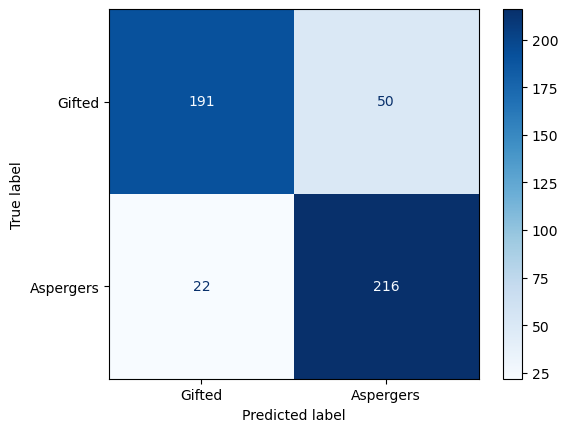

In [40]:
# plot the confusion matrix
plot_confusion_matrix(lr, X_test_lr_tvec, y_test, cmap='Blues', 
                      values_format = 'd', display_labels = ['Gifted', 'Aspergers']);

Comment: Our classifier consistently produces more type I errors (False Positives) than type II errors (False Negatives) proportionally. 
- Type I error (False Positive): Individuals who are actually gifted, but were falsely diagnosed with aspergers by the model.
- Type II error (False Negative): Individuals who actually have aspergers, but were falsely labelled as gifted by the model. 

Which type of error is worse and should be avoided in this context? <br> <br>
Both errors are equally bad. Having asperger's yet being told otherwise by the model, and being gifted yet being told otherwise by the model are equally detrimental for the inidividual as he/she would not be able to get targeted prefessional help. A misdiagnosis could also lead to therapy that does not address the root cause and secondary conditions and medical expenditures stemming from it. 

In [41]:
# the 50 posts that were falsely predicted as aspergers, but should be gifted
fp_array = np.where((y_test == 0) & (pred == 1))[0]

# the 191 posts that were rightly predicted as gifted, and are indeed gifted
tn_array = np.where((y_test == 0) & (pred == 0))[0]

# the 22 posts that were falsely predicted as gifted, but should be aspergers
fn_array = np.where((y_test == 1) & (pred == 0))[0]

# the 216 posts that were rightly predicted as aspergers, and are indeed aspergers
tp_array = np.where((y_test == 1) & (pred == 1))[0]

# return the index in y_test
print('False Positive Array')
print(fp) 
print('\n')
print('True Negative Array')
print(tn) 
print('\n')
print('False Negative Array')
print(fn)
print('\n') 
print('True Positive Array')
print(tp) 
print('\n')

False Positive Array
50


True Negative Array
191


False Negative Array
22


True Positive Array
216




In [42]:
# extract all 50 fp posts - ground truth '0'
fp_index = y_test.iloc[fp_array]
fp_post = fp_index.index.to_numpy()

# extract all 191 tn posts - ground truth '0'
tn_index = y_test.iloc[tn_array]
tn_post = tn_index.index.to_numpy()

# extract all 22 fn posts - ground truth '1'
fn_index = y_test.iloc[fn_array]
fn_post = fn_index.index.to_numpy()

# extract all 216 tp posts - ground truth '1'
tp_index = y_test.iloc[tp_array]
tp_post = tp_index.index.to_numpy()

In [43]:
# check to ascertain you are extracting the right posts

# extract all 50 fp posts - ground truth '0'
print(f'Extract all 50 fp posts.')
print(f'Ground Truth: {fp_index.unique()}.')
print(f'Number of fp posts: {len(fp_post)}.')
print('\n')

# extract all 191 tn posts - ground truth '0'
print(f'Extract all 191 tn posts.')
print(f'Ground Truth: {tn_index.unique()}.')
print(f'Number of tn posts: {len(tn_post)}.')
print('\n')

# extract all 22 fn posts - ground truth '1'
print(f'Extract all 22 fn posts.')
print(f'Ground Truth: {fn_index.unique()}.')
print(f'Number of fn posts: {len(fn_post)}.')
print('\n')

# extract all 216 tp posts - ground truth '1'
print(f'Extract all 216 tp posts.')
print(f'Ground Truth: {tp_index.unique()}.')
print(f'Number of tp posts: {len(tp_post)}.')
print('\n')

Extract all 50 fp posts.
Ground Truth: [0].
Number of fp posts: 50.


Extract all 191 tn posts.
Ground Truth: [0].
Number of tn posts: 191.


Extract all 22 fn posts.
Ground Truth: [1].
Number of fn posts: 22.


Extract all 216 tp posts.
Ground Truth: [1].
Number of tp posts: 216.




In [44]:
# df of 50 fp posts - true diagnosis '0'
fp_posts = df.iloc[fp_post]

# df of 191 tn posts - true diagnosis '0'
tn_posts = df.iloc[tn_post]

# df of 22 fn posts - true diagnosis '1'
fn_posts = df.iloc[fn_post]

# df of 216 tp posts - true diagnosis '1'
tp_posts = df.iloc[tp_post]

In [45]:
# examine 50 fp posts - true diagnosis '0'
fp_posts

,text_feature,diagnosis,text_clean,no_stop_words,lemma
1354,"How would you describe your empathy level? You can also leave a comment explaining your own case better, if you want to.\n\n[View Poll](https://www.reddit.com/poll/ytk6iw)",0,how would you describe your empathy level you can also leave a comment explaining your own case better if you want toview pollhttpswwwredditcompollytk6iw,"[would, describe, empathy, level, also, leave, comment, explaining, case, better, want, toview, pollhttpswwwredditcompollytk6iw]",would describe empathy level also leave comment explaining case better want toview pollhttpswwwredditcompollytk6iw
1170,Have you purchased a lottery ticket in the past 6 months? Poll\n\n[View Poll](https://www.reddit.com/poll/10bxglw),0,have you purchased a lottery ticket in the past 6 months pollview pollhttpswwwredditcompoll10bxglw,"[purchased, lottery, ticket, past, 6, months, pollview, pollhttpswwwredditcompoll10bxglw]",purchased lottery ticket past 6 month pollview pollhttpswwwredditcompoll10bxglw
1011,"How do you ""think/feel"" about autism and ADHD? Last year I started going to a psychiatrist to get ADHD pills, and I got an autism diagnosis, but I'm having a hard time coming with terms with these diagnoses. I'm highly skeptical about the validity of these disorders, mostly on a personal level, but sometimes even when thinking about other people.\n\n&#x200B;\n\nWhen I first went to my psychiatrist I had spent weeks learning more about ADHD and I felt like getting a diagnosis for it would really help me. As a small child I was lucky that I got stimulated by my parents and got my mind engaged, but eventually things changed and I became ""lazy"". I've always guilted myself for not actively trying harder as a teenager, so finding out about ADHD made sense and brought me temporary relief - ""it's not that I didn't try harder, my brain just didn't know better"", or something along these lines.\n\nI never got a formal diagnosis of ADHD, I just said why I thought I had it to my psychiatrist and she prescribed me a stimulant. So I always questioned if it was ""fair"" to get the pills, if I really needed them. I eventually decided to quit it, but apparently I got way moodier than when I was on them and my life got messier. My mom had an argument with me about it and now I'm taking them again, but only when I have to make chores or do college/work stuff I find very boring.\n\nFor my autism diagnosis, I don't really ""remember"" why I decided to get it. After thinking so much about it, I deconstructed any self-convincing reasons I could have for it. An online friend of mine got a diagnosis last year, and after talking a bunch to him and making my research I thought it made sense that I'm autistic too. So I scheduled an assesment with a trusting evaluator, and she concluded I'm actually autistic in my first session, just with an interview and a questionnaire.\n\nI got quite excited about the autism diagnosis but this feeling got quickly dilluted too. I didn't want my parents to know about this, so I didn't have anyone to tell about how I acted during my childhood other than myself during the assessment. I wouldn't say I lied when talking about it, but I also don't think I really looked and behaved as an autistic kid. The evaluator said it was fine that I didn't have someone else in my assesment because she was really sure I'm actually on the spectrum, but I don't know how to feel about this. I feel like I cheated, if this makes sense.\n\n&#x200B;\n\nI don't feel comfortable saying I have ADHD or that I'm autistic. I can't not see ADHD as something other than a social issue, I can't see it as a personal issue I have. I just take stimulants because they give me an advantage and it would be silly of me not to use this in my favor.\n\nAnd I don't know why I should consider myself autistic, I don't have a clear reason for this or any advantage to get. I can relate to traits but I don't know how much these impact my life negativ

In [46]:
# examine 191 tn posts - true diagnosis '0'
tn_posts

text_feature  \
1408                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               Who else is anti intellectual? I was typing a really long rant about how "intelligence" as a concept is pointless and misused and how I hate hearing people using the term "intelligence"/"IQ" to refer to things that it doesn't pertain, etc etc and I realized that I can't be bothered.\n\nWhatever this thing called "intelligence" is, I want nothing to do with. I always known that I played dumb for convenience, I just never realize the extent to which I have been doing it. One of a byproduct of (at least my type of) intelligence is that I'm very good at reading the room and realizing where everyone else is at, and then learn to immediately pretend to be on exactly the same page with everyone else, whether they are right or wrong. That skill helps with amateur acting I found out, I just didn't realize how long I have been doing it.\n\nI can think of so many things that can be described as intelligence, and none of them are related to each other, worse yet, no one even seems to even try to measure most of them.\n\nThe "IQ" people want to measure (IQ tests, SAT, GRE, MCAT, LSAT, etc.) is almost exclusively linear processing, and (almost) no thoughts been given to parallel processing (incidentally linear processing is almost useless in real life unless you're a computer programmer). No one seems to care about a measurement for anything more multidimensional e.g. sensory integration or even anything more straightforward (but more useful) e.g. short term tactile memory (I know it's under explored because I talked to a PhD program about that and those fuckers seem to think this idea, as straightforward as it is, is a good idea).\n\nThis gives rise to certain wishful narratives about the "idiot savant" or the "autistic genius", as though something has always have to give because "you can't be smart and be normal" or something, like a self fulfilling prophecy because people are hellbent in trying to paint the capacity of thought in the manner that only apply to linear processing, and people who are good at linear processing must then, for whatever reason, be bad at being human (being human is supposedly a byword for sensory and abstract integration in parallel processing, which, ironically, these humans couldn't find a word for).\n\nWhatever my beef is with intelligence, it just makes me sick and tired and not want to be bothered with having a genuine conversation with anyone about anything. Simplified example, I want to go buy a fun sports car, people will start talking to me about horsepower. Am I gonna sta

In [47]:
# exmaine 22 fn posts - true diagnosis '1'
fn_posts

,text_feature,diagnosis,text_clean,no_stop_words,lemma
62,"[Rant] Kinda bummed that I'll probably never be able to have a job I've been on temporary disability pension because of Asperger's since I was 20. Never worked in my life, I was stressing out about my first year of school that I couldn't finish. I didn't know how I was going to get income when I drop out since in my country you are entitled to financial aid while you're a student if you have a condition that makes your functioning limited.\n\nMy mom suggested disability pension since she knows a lot about these things because of her work. I had no idea such thing even existed but when I read about it I thought ""Hey, this sounds like something I could qualify for!"". So I got fixated on the idea that I -will- get a pension and I'll -never- have to worry about money again.\n\nFast forward an unknown time and here I am twiddling my thumbs at age 23, a year left of my pension. I will probably quality for it once again, but man do I have dreams. \n\nI wish to be a pharmacist or an entrepeneur. My doctor asked me where I see myself in the future, and I told her that I wanted to start studying pharmacology and start working at a pharmacy. She shut me down and asked if I have ""realistic dreams"". She might be right, I have too much issues with stress and sensory overload. I don't think I'd actually be able to study full time.\n\nOr did she gaslight me? I don't know, but man I wish I had a skill or a profession. Everytime I try to learn something new I get overstimulated with information and eventually shut down.\n\nI want to be so many things. A screenwriter, an author, a 3D artist... but my human condition is being limited by Asperer's. I kind of hate it.\n\nI guess I just gotta sit down and enjoy my pension and special interests, while I can.",1,rant kinda bummed that ill probably never be able to have a job ive been on temporary disability pension because of aspergers since i was 20 never worked in my life i was stressing out about my first year of school that i couldnt finish i didnt know how i was going to get income when i drop out since in my country you are entitled to financial aid while youre a student if you have a condition that makes your functioning limitedmy mom suggested disability pension since she knows a lot about these things because of her work i had no idea such thing even existed but when i read about it i thought hey this sounds like something i could qualify for so i got fixated on the idea that i will get a pension and ill never have to worry about money againfast forward an unknown time and here i am twiddling my thumbs at age 23 a year left of my pension i will probably quality for it once again but man do i have dreams i wish to be a pharmacist or an entrepeneur my doctor asked me where i see myself in the future and i told her that i wanted to start studying pharmacology and start working at a pharmacy she shut me down and asked if i have realistic dreams she might be right i have too much issues with stress and sensory overload i dont think id actually be able to study full timeor did she gaslight me i dont know but man i wish i had a skill or a profession everytime i try to learn something new i get overstimulated with information and eventually shut downi want to be so many things a screenwriter an author a 3d artist but my human condition is being limited by asperers i kind of hate iti guess i just gotta sit down and enjoy my pension and special interests while i can,"[rant, kinda, bummed, ill, probably, never, able, job, ive, temporary, disability, pension, aspergers, since, 20, never, worked, life, stressing, first, year, school, couldnt, finish, didnt, know, going, get, income, drop, since, country, entitled, financial, aid, youre, student, condition, makes, functioning, limitedmy, mom, suggested, disability, pension, since, knows, lot, things, work, idea, thing, even, existed, read, thought, hey, sounds, like, something, could, qualify, 

In [48]:
# examine 216 tp posts - true diagnosis '1'
tp_posts

text_feature  \
10                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           Woman abuses her dog in front of me, and tries to hunt me down three days after I called her out on it Hello,\n\nA few days ago while I was on my lunch break, I took a walk and noticed an older woman (looked around mid 60s) with her friend taking a walk with her dog. She was coming from an intersection and I was behind them for around 2.5 minutes. During that time, I noticed that every single time her dog was trying to take a poop, she would just very harshly tug on its collar for (dog was trailing right behind her, and would keep tugging everytime she felt the dog stop). I noticed that as time went on, the increments between each time the dog needed to poop got shorter, indicating that he really, really needed to go. As they were about to go off to the other trail, I caught u

#### 3. Generate classification report. Alternatively, compute Precision, Sensitivity (Recall) / Specificity, and F1 score using classification_report() function from sklearn.
- The following intepretations are based on the assumption that individuals who posted on the r/aspergers and r/Gifted subreddits have indeed been officially disgnosed with the respective conditions.In other words:
> * member of r/aspergers = individual who have been clinically diagnosed with aspergers by a qualified health professional
> * member of r/Gifted = individual who have been officially diagnosed as gifted by a qualified educator / institution

In [49]:
# import the neccessary function from the sklearn module
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, plot_roc_curve, roc_curve

In [50]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.90      0.79      0.84       241
           1       0.81      0.91      0.86       238

    accuracy                           0.85       479
   macro avg       0.85      0.85      0.85       479
weighted avg       0.85      0.85      0.85       479



In [51]:
# accuracy score by hand
acc = (tn + tp) / (tn + fp + fn + tp)
print(f'The accuracy of the model is {acc}, by manual computation.')

The accuracy of the model is 0.8496868475991649, by manual computation.


In [52]:
# accuracy score from the model
print (f'From the model, the accuracy of the model is {lr.score(X_test_lr_tvec, y_test)}.')

From the model, the accuracy of the model is 0.8496868475991649.


In [53]:
# accuracy score from sklearn.metrics
print(f'From sklearn.metrics, the accuracy of model is {accuracy_score(y_test, pred)}.')

From sklearn.metrics, the accuracy of model is 0.8496868475991649.


In [54]:
# misclassification rate by hand
m_rate = (fp + fn) / (tp + fp + tn + fn) 
print(f'The misclassification rate of the model is {m_rate}, by manual computation.')

The misclassification rate of the model is 0.15031315240083507, by manual computation.


In [55]:
# misclassification rate from sklearn metrics
# no such function from sklearn module

Comments on Accuracy: 

- Accuracy = All Correct (Ground Truths) / All Predictions
> * In other words, Accuracy = (TP + TN) / (TP + FP + TN + FN). It is the percentage of observations that the model predicted correctly. <br>
> * Interpretation: Out of all the predictions made by the model, there is an 86% probability that the model makes an accurate prediction.

- Misclassification Rate = All Incorrect / All Predictions 
> * In other words, NPV = TN / (TN + FN). It is the percentage of observations that the model predicted incorrectly. <br>
> * Interpretation: Out of all the predictions, there is a 14% probability that the model makes an inaccurate prediction. 

* The interpretations are based on the assumption that (TN, FP, FN, TP) = (193, 48, 20, 218). Note that the values of tn, fp, fn, tp is marginally different every time you execute the program. Hence the assumption (values of TN, FP, FN, TP) will change each time you execute the program.

In [56]:
# precision score by hand
prec = tp / (tp + fp)
print(f'The precision of the model is {prec}, by manual computation.')

The precision of the model is 0.8120300751879699, by manual computation.


In [57]:
# precision score from sklearn.metrics
print(f'From sklearn.metrics, the precision of the model is {precision_score(y_test, pred)}.')

From sklearn.metrics, the precision of the model is 0.8120300751879699.


In [58]:
# negative predictive value by hand
npv = tn / (tn + fn)
print(f'The negative predictive value of the model is {npv}, by manual computation.')

The negative predictive value of the model is 0.8967136150234741, by manual computation.


In [59]:
# negative predictive value from sklearn.metric
# no such function from sklearn module

Comments on Precision (PPV) / NPV: 

- Precision (PPV) = True Positives / Predicted Positives
> * In other words, Precision (PPV) = TP / (TP + FP). It is the Positive Predictive Value of the model. <br>
> * Interpretation: If post was predicted to be written by an individual with aspergers, there is an 82% probability that the writer of the post does actually have aspergers.

- Negative Predictive Value (NPV) = True Negatives / Predicted Negatives 
> * In other words, NPV = TN / (TN + FN). It is the Negative Predictive Value of the model. <br>
> * Interpretation: If post was predicted to be written by an individual who is gifted, there is a 91% probability that the subject is actually gifted. 

In [60]:
# sensitivity (recall) score by hand
recall = tp / (tp + fn)
print(f'The sensitivity(recall) of the model is {recall}, by manual computation.')

The sensitivity(recall) of the model is 0.907563025210084, by manual computation.


In [61]:
# sensitivity(recall) score from sklearn metric
print(f'From sklearn.metrics, the sensitivity(recall) of the model is {recall_score(y_test, pred)}.')

From sklearn.metrics, the sensitivity(recall) of the model is 0.907563025210084.


In [62]:
# specificity score by hand
spec = tn / (tn + fp)
print(f'The specificity of the model is {spec}, by manual computation.')

The specificity of the model is 0.7925311203319502, by manual computation.


In [63]:
# specificity score from sklearn metric
# no such function from sklearn module

Comments on Sensitivity (Recall) / Specificity:

- Sensitivity (Recall) = True Positives / All Positives 
> * In other words, Sensitivity (Recall) = TP / (TP + FN) = TP / P. <br> 
> * Interpretation: If post was predicted to be written by an individual with aspergers, there is a 92% probability that the writer of the post does actually have aspergers. 

- Specificity = True Negative / All Negatives
> * In other words, Specificity = TN / (TN + FP) = TN / N. <br> 
> * Interpretation: If post was predicted to be written by an individual from the gifted community, there is an 80% probability that the subject is actually gifted. 

In [64]:
# F1 score by hand
print(f"The F1 score of the model is {2 * (prec*recall) / (prec + recall)}, by manual computation.")

The F1 score of the model is 0.857142857142857, by manual computation.


In [65]:
# F1 score from sk.learn metric
print(f"From sklearn.metrics, the FI score of the model is {f1_score(y_test, pred)}.")

From sklearn.metrics, the FI score of the model is 0.857142857142857.


Comments on F1 Score: The F1 score is the harmonic mean of precision and recall. If you care about precision and recall roughly the same amount, F1 score is a great metric to use.

$$
2*\frac{(\text{Precision}*\text{Recall})} {(\text{Precision} + \text{Recall})}
$$


#### Visualise the relationship between Sensitivity (TPR) and False Positive Rate (Type I Error Rate) using the ROC/AUC curve. 
Plot the True Positive Rate vs. False Positive Rate for the range of possible decision thresholds and you get the ROC curve.
- True Positive Rate (TPR): Sensitivity (Recall) - Out of all individuals with aspergers, the percentage that was rightly predicted to have aspergers by the model.
- False Positive Rate (FPR) : Rate of Type I Error - Out of all gifted individuals, the percentage that was falsely predicted to have aspergers by the model.
- True Negative Rate (TNR): Specificity - Out of all gifted individuals, the percentage that was rightly predicted to be gifted by the model.
- False Negative Rate (FNR) : Rate of Type II Error - Out of all individuals with aspergers, the percentage that was falsely predicted to be gifted by the model. 

/usr/local/Caskroom/miniconda/base/envs/dsi-sg/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


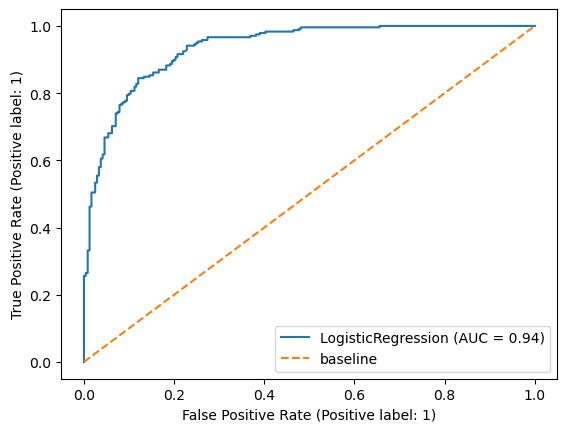

In [66]:
# plotting the AUC-ROC curve
# can you also create the ROC curve by plotting the TNR against the FNR for the range of possible decision thresholds (3rd dimension)?
plot_roc_curve(lr, X_test_lr_tvec, y_test)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--')
plt.legend();

In [67]:
# compute roc_auc score by hand
# uncertain about the mathematical formula

In [68]:
# compute roc_auc score from sk.learn metric
# AUC is not dependent on classification threshold
# because AUC is an aggregate measure of ROC
# but you can use the ROC curve to identify an optimal threshold
print(f" The Area Under Curve is {roc_auc_score(y_test, lr.predict_proba(X_test_lr_tvec)[:,1])}.")

 The Area Under Curve is 0.9357979706405384.


Comments on AUC: One measure of how much overlap exists between our class distributions is the area under the ROC curve.
<br> 
- The closer your ROC-AUC is to 1, the better (1 is the maximum score). 0.92 is a score which indicates that the model is doing a good job at separating the positive (aspergers) and negative (gifted) populations.
> * If you have an ROC AUC of 1, your positive and negative populations are perfectly separated and your model is as good as it can get. 
> * If you have an ROC AUC of 0.5, your positive and negative populations perfectly overlap and your model is as bad as it can get. 
> * If you have an ROC AUC of below 0.5, your positive and negative distributions have flipped sides. By flipping your predicted values (i.e. flipping predicted 1s and 0s), your ROC AUC will now be above 0.5.

In [69]:
# create a dataframe called pred_df that contains:
# 1. true values of our test set.
# 2. predicted probabilities based on our model.

pred_df = pd.DataFrame({'true_values': y_test,
                        'pred_probs': lr.predict_proba(X_test_lr_tvec)[:,1]})

pred_df.head()

,true_values,pred_probs
1354,0,0.616422
1408,0,0.351207
10,1,0.808796
440,1,0.798938
260,1,0.646705


The area under curve is 0.9357979706405384.
Optimal Threshold Value is: 0.5884755306435173, to be exact.


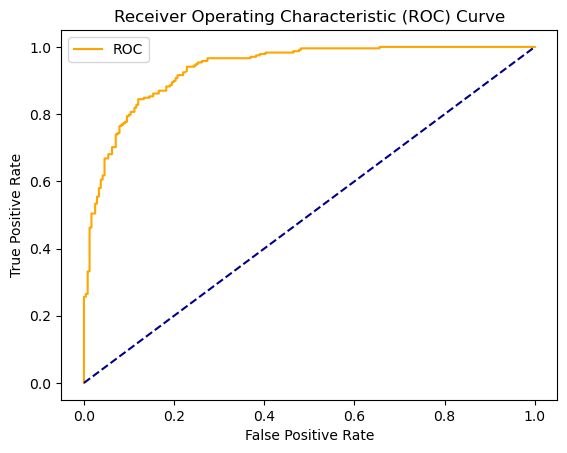

In [70]:
# use the ROC curve to identify the optimal threshold - the optimal cut off would be where TPR is high and 
# FPR is low / TPR- (1-TPR) is zero or near to zero is the optimal cut off point
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

y_true = pred_df.true_values
y_scores = pred_df.pred_probs

fpr, tpr, thresholds = roc_curve(y_true, y_scores)
# print(tpr)
# print(fpr)
# print(thresholds)
print(f"The area under curve is {roc_auc_score(y_true, y_scores)}.")
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(f"Optimal Threshold Value is: {optimal_threshold}, to be exact.")
plot_roc_curve(fpr, tpr);

#### Visualise the trade-off between Type I Error (FPR) and Type II Error (FNR) when you shift the classification threshold using Histograms. 
- Optimal Classification Threshold depends on your business use case.

/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gn/T/ipykernel_93195/1354796784.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(group[1], kde = False, bins = 20, label = f'Actual Outcome = {group[0]}')


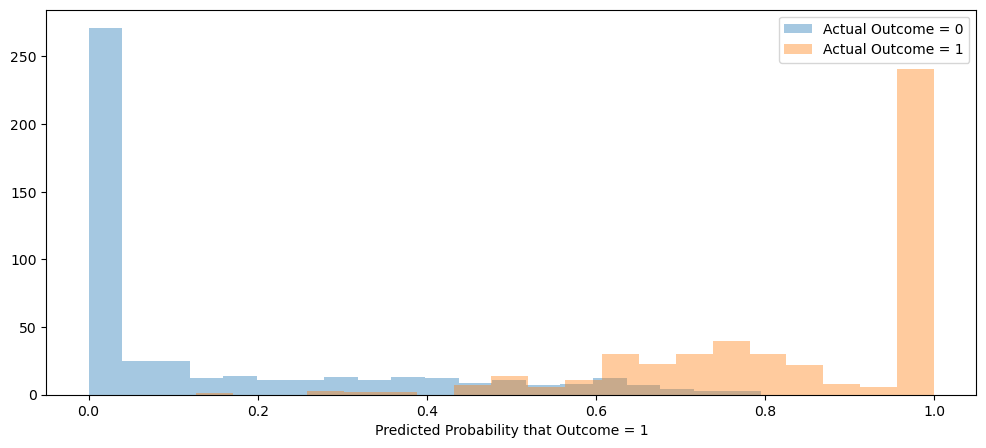

In [71]:
plt.figure(figsize = (12, 5))

# plot distributions of predicted probabilities by actual values
for group in pred_df.groupby('true_values'):
    sns.distplot(group[1], kde = False, bins = 20, label = f'Actual Outcome = {group[0]}')

plt.xlabel('Predicted Probability that Outcome = 1')
plt.legend();

/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gn/T/ipykernel_93195/2204910803.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(group[1], kde = False, bins = 20, label = f'Actual Outcome = {group[0]}')


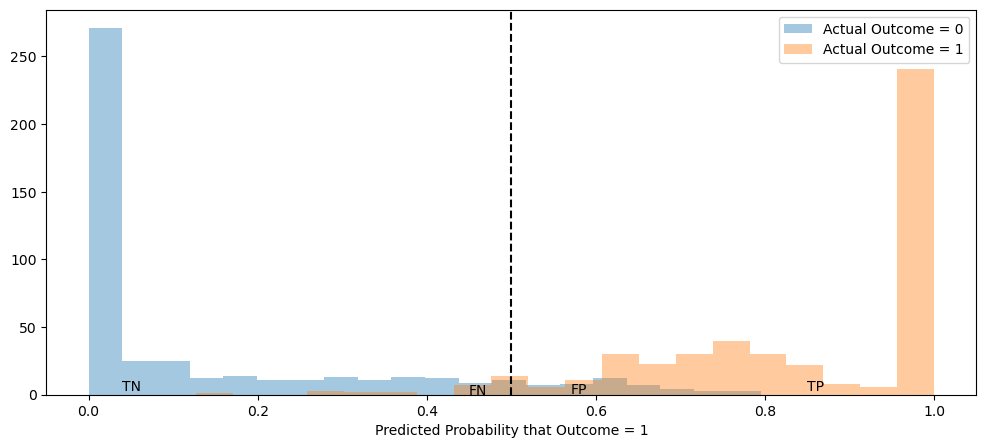

In [72]:
# using 50% as the cutoff between the positive and negative classes/diagnoses
plt.figure(figsize = (12, 5))

# plot distributions of predicted probabilities by actual values
for group in pred_df.groupby('true_values'):
    sns.distplot(group[1], kde = False, bins = 20, label = f'Actual Outcome = {group[0]}')

# Add cutoff line
plt.axvline(0.5, color = 'black', linestyle = '--')

# Add annotations for TN, FN, TP, FP.
plt.annotate(xy = (0.04, 3), text = 'TN', size = 10)
plt.annotate(xy = (0.45, 0), text = 'FN', size = 10)
plt.annotate(xy = (0.85, 3), text = 'TP', size = 10)
plt.annotate(xy = (0.57, 1), text = 'FP', size = 10)

plt.xlabel('Predicted Probability that Outcome = 1', fontsize = 10)
plt.legend(fontsize = 10);

In [73]:
print(f"1. Classification threshold (default) between the positive and negative classes at 50% - Baseline.")
print(f"True Positive Rate (TPR) = {tp/(tp+fn)}")
print(f"False Positive Rate (FPR) = {fp/(tn+fp)}")
print(f"True Negative Rate (TNR) = {tn/(tn+fp)}")
print(f"False Negative Rate (FNR) = {fn/(tp+fn)}")

1. Classification threshold (default) between the positive and negative classes at 50% - Baseline.
True Positive Rate (TPR) = 0.907563025210084
False Positive Rate (FPR) = 0.2074688796680498
True Negative Rate (TNR) = 0.7925311203319502
False Negative Rate (FNR) = 0.09243697478991597


/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gn/T/ipykernel_93195/2474106379.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(group[1], kde = False, bins = 20, label = f'Actual Outcome = {group[0]}')


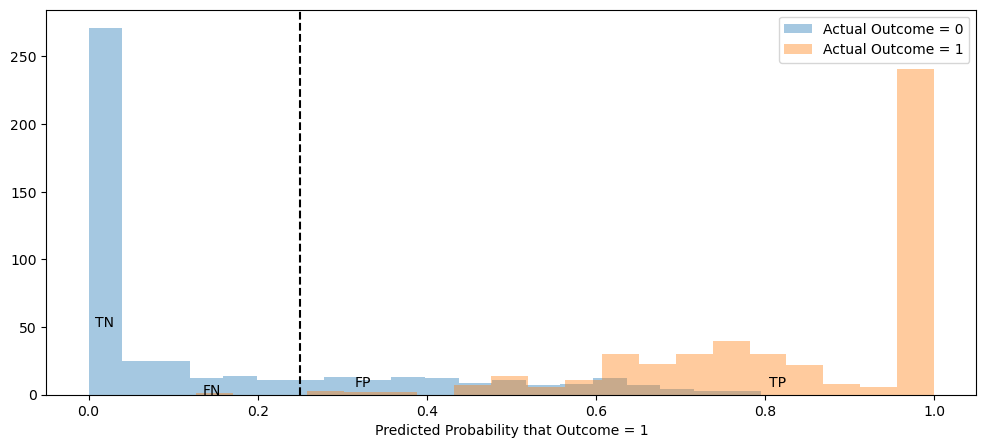

In [74]:
# lower classification threshold down to 25%, to the left
plt.figure(figsize = (12, 5))

# plot distributions of predicted probabilities by actual values
for group in pred_df.groupby('true_values'):
    sns.distplot(group[1], kde = False, bins = 20, label = f'Actual Outcome = {group[0]}')

# add cutoff line
plt.axvline(0.25, color = 'black', linestyle = '--')

# Add annotations for TN, FN, TP, FP.
plt.annotate(xy = (0.0075, 50), text = 'TN', size = 10)
plt.annotate(xy = (0.135, 0), text = 'FN', size = 10)
plt.annotate(xy = (0.805, 5.75), text = 'TP', size = 10)
plt.annotate(xy = (0.315, 5.75), text = 'FP', size = 10)

plt.xlabel('Predicted Probability that Outcome = 1', fontsize = 10)
plt.legend(fontsize = 10);

In [75]:
print(f"2. Classification threshold between the positive and negative classes at 25%.")
print(f"True Positive Rate (TPR) ↑ relative to baseline.")
print(f"False Positive Rate (FPR) ↑ relative to baseline.")
print(f"True Negative Rate (TNR) ↓ relative to baseline.")
print(f"False Negative Rate (FNR) ↓ relative to baseline.")

2. Classification threshold between the positive and negative classes at 25%.
True Positive Rate (TPR) ↑ relative to baseline.
False Positive Rate (FPR) ↑ relative to baseline.
True Negative Rate (TNR) ↓ relative to baseline.
False Negative Rate (FNR) ↓ relative to baseline.


/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gn/T/ipykernel_93195/2765402084.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(group[1], kde = False, bins = 20, label = f'Actual Outcome = {group[0]}')


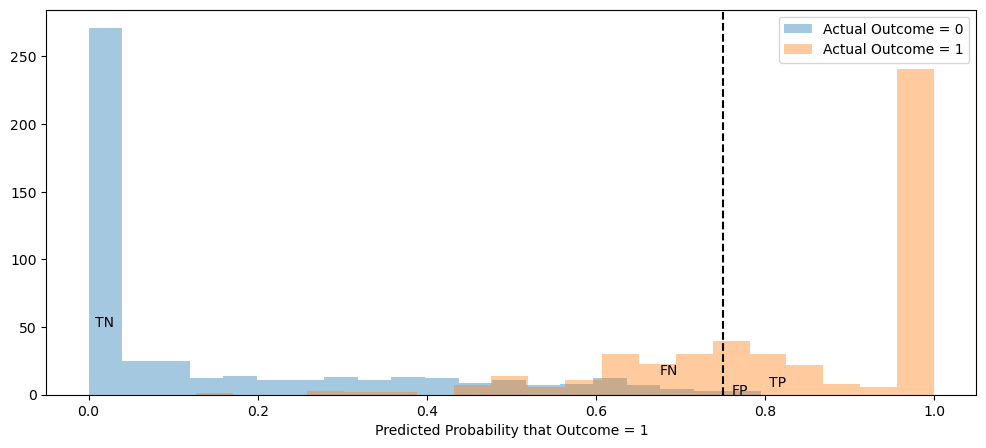

In [76]:
# increase classification threshold up to 75%, to the right
plt.figure(figsize = (12, 5))

# plot distributions of predicted probabilities by actual values
for group in pred_df.groupby('true_values'):
    sns.distplot(group[1], kde = False, bins = 20, label = f'Actual Outcome = {group[0]}')

# add cutoff line
plt.axvline(0.75, color = 'black', linestyle = '--')

# add annotations for TN, FN, TP, FP.
plt.annotate(xy = (0.0075, 50), text = 'TN', size = 10)
plt.annotate(xy = (0.675, 15), text = 'FN', size = 10)
plt.annotate(xy = (0.805, 5.75), text = 'TP', size = 10)
plt.annotate(xy = (0.76, 0), text = 'FP', size = 10)

plt.xlabel('Predicted Probability that Outcome = 1', fontsize = 10)
plt.legend(fontsize = 10);

In [77]:
print(f"3. Classification threshold between the positive and negative classes at 75%.")
print(f"True Positive Rate (TPR) ↓ relative to baseline.")
print(f"False Positive Rate (FPR) ↓ relative to baseline.")
print(f"True Negative Rate (TNR) ↑ relative to baseline.")
print(f"False Negative Rate (FNR) ↑ relative to baseline.")

3. Classification threshold between the positive and negative classes at 75%.
True Positive Rate (TPR) ↓ relative to baseline.
False Positive Rate (FPR) ↓ relative to baseline.
True Negative Rate (TNR) ↑ relative to baseline.
False Negative Rate (FNR) ↑ relative to baseline.


In [78]:
y_test.value_counts(normalize=True)

0    0.503132
1    0.496868
Name: diagnosis, dtype: float64

Comment: The optimal classification threshold depends on the objective of the model.

Typically, you shift your threshold away from the default cut-off in 1 of the 2 following scenarios:
1. High Recall, Low Precision (25% Classification Threshold) 
- In this scenario, you might want a High Recall, which means that all individuals who potentially have aspergers will be notified to go for further screening and interventions (True Positive Rate ↑ ), even if it means falsely classifying some gifted individuals as individuals with aspergers (False Positive Rate ↑), risking Low Precision.
- Type II Error (FNR) ↓ at the expense of Type I Error (FPR) ↑
<br> 
2. High Precision, Low Recall (75% Classification Threshold) 
- In this scenario, you might want a High Precision, which means that you only want individuals who truly have aspergers  (↓ True Positive Rate and ↓ False Positive Rate) to be notified for further screening and interventions, even if it means missing/leaving out of some individuals who could potentially have aspergers (False Negative Rate ↑), risking Low Recall.
- Type I Error (FPR) ↓ at the expense of Type II Error (FNR) ↑ 

Domain Application: 
> e.g., Education Industry – focus on sifting out only those who are truly gifted to undergo advanced cirriculum, without wasting to much resources, opt to lower the classification threshold - Scenario 1.
<br>
> e.g., Healthcare Industry – focus on sifting out only those who truly have aspergers to undergo treatment, without wasting to much resources, opt to increase the classification threshold - Scenario 2.

#### Changing your prediction threshold and the corresponding changes in the accuracy of the model.

In [79]:
def get_predictions(probabilities, threshold):
    return [0 if prob < threshold else 1 for prob in probabilities]

In [80]:
print(get_predictions(lr.predict_proba(X_test_lr_tvec)[:,1], 0.3)[:10])

[1, 1, 1, 1, 1, 1, 1, 0, 1, 1]


In [81]:
threshold_list = [0.25, 0.4, 0.5, 0.6, 0.75]

for threshold in threshold_list:
    preds = get_predictions(lr.predict_proba(X_test_lr_tvec)[:,1], threshold)
    acc = accuracy_score(y_test, preds)
    print(f'Threshold: {threshold}, Accuracy: {acc}')

Threshold: 0.25, Accuracy: 0.7473903966597077
Threshold: 0.4, Accuracy: 0.824634655532359
Threshold: 0.5, Accuracy: 0.8496868475991649
Threshold: 0.6, Accuracy: 0.8538622129436325
Threshold: 0.75, Accuracy: 0.6993736951983298


Comment: The optimal classification threshold for our model is slightly higher than 0.5, at 0.6.

In [ ]:
# perform regularization

In [ ]:
# use LIME to interpret logistic regression coefficients and weights